# RayDer lighting pilot: evaluation and inspection

Evaluate the validation-selected Stage-1 checkpoint, inspect held-camera examples, run a wrong-light control, evaluate the completely held-out objects recorded in the run arguments, and qualitatively probe the lighting controller on RE-10k clips from RayDer's pretraining distribution. The cached illumination pool is not an unseen-light split; that is intentional for this feasibility run. Camera poses are jointly inferred from the three context images and the target view under source lighting, matching the training protocol. The target image participates only in pose estimation and remains excluded from every decoder context.

In [1]:
import copy, json, logging, math, os, sys, warnings
from argparse import Namespace
from pathlib import Path
os.environ.setdefault('MPLCONFIGDIR', '/tmp/rayder-matplotlib')
ROOT = Path.cwd()
if ROOT.name == 'notebooks': ROOT = ROOT.parent
sys.path.insert(0, str(ROOT))

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
warnings.filterwarnings('error', message='flex_attention called without torch.compile')
from rayder.model import Camera
from rayder.open_illumination import OpenIlluminationOLAT
from experiments.train_pilot import (PILOT_CAMERA_IDS, PilotBatch, batches_from_cache, camera_conditioning_for_batch, flex_attention_is_compiled, forward_loss, heldout_camera_map, load_cached_object, load_model, load_perceptual_model, make_assignments, make_cache_lobes, nearest_cameras, predict_batch, prepare_render_cache, project_lobe, validate)

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
RUN_DIR = ROOT / 'outputs/openillumination-pilot-stage1/2026-09-10_18-02-13'
CHECKPOINT = RUN_DIR / 'checkpoints/best.pt'
print(DEVICE, CHECKPOINT)

/mnt/warm/dev/rayder/.venv/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


cuda /mnt/warm/dev/rayder/outputs/openillumination-pilot-stage1/2026-09-10_18-02-13/checkpoints/best.pt


## Restore the exact run

The notebook defaults to `best.pt`, selected only with held object×camera columns.

In [2]:
args = Namespace(**json.loads((RUN_DIR / 'args.json').read_text()))
args.data_root = ROOT / args.data_root
args.cache_dir = ROOT / args.cache_dir
args.pretrained = Path(args.pretrained)
args.sigma_bins = [tuple(pair) for pair in args.sigma_bins]
args.energy_range = tuple(args.energy_range)
args.effective_support = tuple(args.effective_support)
args.source_direction = tuple(args.source_direction)
args.batch_size = min(args.batch_size, 4)
args.compile_flex_attention = True

reference = OpenIlluminationOLAT(args.data_root, args.train_objects[0])
directions = reference.load_light_positions(normalize=True)
mu = np.asarray(args.source_direction, dtype=np.float64); mu /= np.linalg.norm(mu)
source_lobe = project_lobe(directions, mu, args.source_sigma, args.source_energy, args.prune_threshold, floor_fraction=getattr(args, 'light_floor_fraction', 0.0))
train_lobes, validation_lobes = make_cache_lobes(directions, args)
all_lobes = [*train_lobes, *validation_lobes]
heldout_cameras = heldout_camera_map(args.train_objects, args.split_seed)
checkpoint = torch.load(CHECKPOINT, map_location='cpu', weights_only=False)
print({'step': checkpoint['step'], 'epoch': checkpoint['epoch'], 'heldout cameras': heldout_cameras})

{'step': 8000, 'epoch': 28, 'heldout cameras': {1: 'A1', 2: 'A2', 3: 'A3', 4: 'A4', 5: 'A5', 6: 'A6', 8: 'B2'}}


In [3]:
model = load_model(args, DEVICE)
missing, unexpected = model.load_state_dict(checkpoint['lighting'], strict=False)
assert not unexpected
assert not any('light_encoder' in key or 'light_linear' in key for key in missing)
model.eval()
print(f"Loaded step {checkpoint['step']}; lighting parameters: {sum(p.numel() for p in model.parameters() if p.requires_grad) / 1e6:.2f}M")
assert flex_attention_is_compiled(), 'FlexAttention is still eager; restart the kernel before evaluation.'
print(f"flex attention compiled: {flex_attention_is_compiled()}")

Loaded step 8000; lighting parameters: 19.28M
flex attention compiled: True


## Held-camera aggregate measurements

`source_mse` measures same-light NVS retention and `delta_mse` measures the spatial image change. Negative relative change is better for all MSE/loss rows; positive is better for PSNR.

In [4]:
baseline = json.loads((RUN_DIR / 'baseline_metrics.json').read_text())
perc_model = load_perceptual_model(args, DEVICE)
adapted = validate(model, args, DEVICE, heldout_cameras, source_lobe, train_lobes, validation_lobes, rank=0, world_size=1, perceptual_model=perc_model, perceptual_weight=args.perceptual_weight)
comparison = pd.DataFrame({'zero-init': baseline, 'adapted': adapted})
comparison['relative change (%)'] = 100 * (comparison['adapted'] / comparison['zero-init'] - 1)
comparison

Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [on]


/mnt/warm/dev/rayder/.venv/lib/python3.13/site-packages/torchvision/models/_utils.py:207: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/mnt/warm/dev/rayder/.venv/lib/python3.13/site-packages/torchvision/models/_utils.py:222: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /mnt/warm/dev/rayder/.venv/lib/python3.13/site-packages/lpips/weights/v0.1/vgg.pth


,zero-init,adapted,relative change (%)
delta_mse,0.054238,0.022952,-57.683485
loss,0.382739,0.154226,-59.704658
source_mse,0.006975,0.006754,-3.173363
target_mse,0.051498,0.017780,-65.474693
target_psnr,13.219487,17.911283,35.491518
perceptual_loss,0.764665,0.646097,-15.505855
perceptual_source,0.446186,0.362587,-18.736283
perceptual_target,0.541572,0.464803,-14.175124
objective,0.420972,0.186531,-55.690463


In [5]:
def evaluation_batches(cache_args, object_id, target_camera, lobe_indices, lobes):
    retained = [camera for camera in PILOT_CAMERA_IDS if camera != target_camera]
    cameras = (*nearest_cameras(target_camera, retained, 3), target_camera)
    rng = np.random.default_rng(cache_args.val_seed + object_id)
    assignments = make_assignments(len(lobe_indices), 4, rng, 0.0, fixed_target=3)
    cache = load_cached_object(cache_args, object_id)
    return list(batches_from_cache(cache, cameras, lobe_indices, assignments, source_lobe, lobes, cache_args))

def image01(tensor):
    return tensor.detach().float().cpu().numpy() * 0.5 + 0.5

def delta_display(target, source):
    return np.clip(0.5 + (target - source) / 4, 0, 1)

@torch.inference_mode()
def predictions(batch, eval_args=args):
    with torch.autocast(device_type=DEVICE.type, dtype=torch.bfloat16, enabled=DEVICE.type == 'cuda'):
        return tuple(image01(value) for value in predict_batch(model, batch, eval_args, DEVICE))

## Held-camera qualitative examples

Difference images use middle gray for zero, white for positive change, and black for negative change.

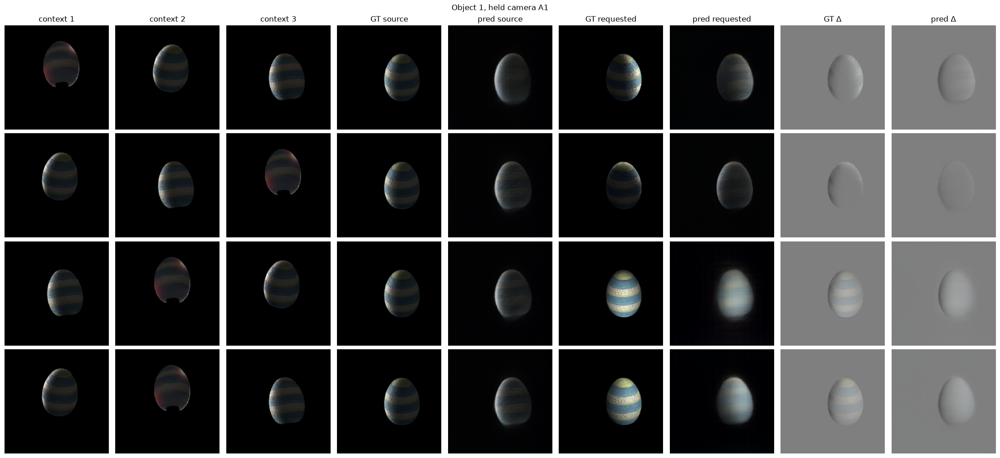

In [6]:
object_id = 1
indices = [len(train_lobes) + index for index in range(16)]
batch = evaluation_batches(args, object_id, heldout_cameras[object_id], indices, all_lobes)[0]
pred_source, pred_requested = predictions(batch)
source, gt_source, gt_requested = image01(batch.source), image01(batch.target_source), image01(batch.target_requested)
titles = ['context 1', 'context 2', 'context 3', 'GT source', 'pred source', 'GT requested', 'pred requested', 'GT Δ', 'pred Δ']
fig, axes = plt.subplots(len(source), len(titles), figsize=(22, 10), constrained_layout=True)
for row in range(len(source)):
    panels = [*source[row], gt_source[row], pred_source[row], gt_requested[row], pred_requested[row], delta_display(gt_requested[row], gt_source[row]), delta_display(pred_requested[row], pred_source[row])]
    for column, panel in enumerate(panels):
        axes[row, column].imshow(np.clip(panel, 0, 1)); axes[row, column].axis('off')
        if row == 0: axes[row, column].set_title(titles[column])
fig.suptitle(f'Object {object_id}, held camera {heldout_cameras[object_id]}')
plt.show()

## Wrong-light control on held columns

Each true requested lobe competes against seven validation-pool distractors. Chance top-1 accuracy is 12.5%. Candidate renders are chunked to keep VRAM bounded.

In [7]:
def slice_batch(batch, index):
    return PilotBatch(**{name: getattr(batch, name)[index:index+1] for name in batch.__dataclass_fields__})

@torch.inference_mode()
def candidate_predictions(example, candidate_lobes, eval_args=args, chunk_size=4):
    outputs = []
    source = example.source.to(DEVICE)
    base, world_rotation = camera_conditioning_for_batch(model, example, source, eval_args, DEVICE)
    n_tokens = (eval_args.size // model.total_spatial_downsample) ** 2
    block_mask = model._inference_block_mask(3, 1, n_tokens, DEVICE)
    for start in range(0, len(candidate_lobes), chunk_size):
        chunk = candidate_lobes[start:start + chunk_size]; count = len(chunk)
        camera_in = Camera(R=base.R[:, :3].expand(count, -1, -1, -1), t=base.t[:, :3].expand(count, -1, -1), f=base.f[:, :3].expand(count, -1))
        camera_target = Camera(R=base.R[:, -1:].expand(count, -1, -1, -1), t=base.t[:, -1:].expand(count, -1, -1), f=base.f[:, -1:].expand(count, -1))
        light = torch.from_numpy(np.stack([lobe.condition for lobe in chunk])).to(DEVICE)[:, None]
        if world_rotation is not None:
            light = light.clone()
            light[..., :3] = torch.einsum('bij,bnj->bni', world_rotation.expand(count, -1, -1).to(light), light[..., :3])
        with torch.autocast(device_type=DEVICE.type, dtype=torch.bfloat16, enabled=DEVICE.type == 'cuda'):
            output = model._reconstruct(source.expand(count, -1, -1, -1, -1), camera_in, camera_target, source.new_zeros(count, 1, model.d_dynamic_state), block_mask, drop_state=True, target_light=light, temporal_positions=torch.tensor([0, 1, 2, 3], device=DEVICE))
        outputs.append(output[:, 0].float().cpu())
    return torch.cat(outputs)

rows = []; offset = len(train_lobes)
for object_id in args.train_objects:
    true_indices = [offset, offset + 1]
    batch = evaluation_batches(args, object_id, heldout_cameras[object_id], true_indices, all_lobes)[0]
    for local_index, true_index in enumerate(true_indices):
        distractors = [offset + ((true_index - offset + shift) % len(validation_lobes)) for shift in range(1, 8)]
        candidates = [all_lobes[true_index], *(all_lobes[index] for index in distractors)]
        example = slice_batch(batch, local_index); output = candidate_predictions(example, candidates)
        target, mask = example.target_requested[0], example.mask[0]
        errors = (((output - target) ** 2) * mask).sum((1, 2, 3)) / (mask.sum() * 3)
        rank = 1 + int((errors[1:] < errors[0]).sum())
        rows.append({'object': object_id, 'camera': heldout_cameras[object_id], 'rank': rank, 'correct': rank == 1, 'true_mse': float(errors[0] / 4), 'best_wrong_mse': float(errors[1:].min() / 4)})
wrong_light = pd.DataFrame(rows)
display(wrong_light)
print({'top1': wrong_light.correct.mean(), 'mean_rank': wrong_light['rank'].mean(), 'median_rank': wrong_light['rank'].median(), 'chance_top1': 1/8})

,object,camera,rank,correct,true_mse,best_wrong_mse
0,1,A1,1,True,0.020365,0.028611
1,1,A1,3,False,0.015740,0.013042
2,2,A2,1,True,0.004138,0.005817
3,2,A2,3,False,0.018078,0.017698
4,3,A3,1,True,0.011775,0.020320
5,3,A3,1,True,0.013767,0.015091
6,4,A4,1,True,0.006133,0.010000
7,4,A4,1,True,0.003067,0.003165
8,5,A5,1,True,0.007722,0.016053
9,5,A5,3,False,0.004877,0.003868


{'top1': np.float64(0.7142857142857143), 'mean_rank': np.float64(1.5), 'median_rank': np.float64(1.0), 'chance_top1': 0.125}


## Build the small final-object cache

This is the first cell that touches the held-out objects. It creates only the fixed source and 16 evaluation lobes per object, separately from training. The OLAT basis is decoded once; later runs memory-map it immediately.

In [8]:
test_args = copy.copy(args)
evaluation_object_ids = tuple(args.test_objects)
assert evaluation_object_ids, 'The saved run has no held-out test objects.'
test_args.train_objects = evaluation_object_ids
test_args.test_objects = ()
evaluation_tag = '-'.join(map(str, evaluation_object_ids))
fill_tag = round(100 * getattr(args, 'light_floor_fraction', 0.0))
test_args.cache_dir = args.data_root / f'pilot_uint8_cache_{args.size}_evaluation_{evaluation_tag}_fill{fill_tag:02d}'
test_args.cache_train_lobes = 0
test_args.cache_validation_lobes = 16
test_args.rebuild_cache = False
test_args.light_floor_fraction = getattr(args, 'light_floor_fraction', 0.0)
test_train_lobes, test_lobes = prepare_render_cache(test_args, directions, source_lobe, logging.getLogger('rayder.final-cache'))
assert not test_train_lobes
print(test_args.cache_dir, len(test_lobes))

/mnt/warm/dev/rayder/notebooks/data/openillumination-mini/pilot_uint8_cache_256_evaluation_12-20_fill10 16


## Completely held-out object measurements

In [9]:
torch.cuda.empty_cache()

final_rows = []; final_batches = {}
for object_id in evaluation_object_ids:
    for target_camera in ('A4', 'B4', 'C4'):
        batches = evaluation_batches(test_args, object_id, target_camera, list(range(8)), test_lobes)
        final_batches[object_id, target_camera] = batches
        for batch in batches:
            with torch.inference_mode(), torch.autocast(device_type=DEVICE.type, dtype=torch.bfloat16, enabled=DEVICE.type == 'cuda'):
                _, metrics = forward_loss(model, batch, test_args, DEVICE)
            final_rows.append({'object': object_id, 'camera': target_camera, 'examples': len(batch.source), **{key: float(value) for key, value in metrics.items()}})
final_metrics = pd.DataFrame(final_rows)
display(final_metrics)
final_metrics.groupby(['object', 'camera']).apply(lambda frame: pd.Series({key: np.average(frame[key], weights=frame.examples) for key in ('target_mse', 'source_mse', 'delta_mse', 'target_psnr')}), include_groups=False)

,object,camera,examples,loss,objective,perceptual_loss,perceptual_target,perceptual_source,target_mse,source_mse,delta_mse,target_psnr
0,12,A4,4,0.050604,0.050604,0.0,0.0,0.0,0.005734,0.002580,0.007377,22.415478
1,12,A4,4,0.067589,0.067589,0.0,0.0,0.0,0.008136,0.002579,0.009796,20.896025
2,12,B4,4,0.067169,0.067169,0.0,0.0,0.0,0.008813,0.002876,0.008586,20.548735
3,12,B4,4,0.068707,0.068707,0.0,0.0,0.0,0.008856,0.002998,0.008960,20.527740
4,12,C4,4,0.075145,0.075145,0.0,0.0,0.0,0.010593,0.002412,0.009145,19.749735
5,12,C4,4,0.070448,0.070448,0.0,0.0,0.0,0.009625,0.002668,0.008724,20.166145
6,20,A4,4,0.044241,0.044241,0.0,0.0,0.0,0.005011,0.001606,0.006676,23.000572
7,20,A4,4,0.116271,0.116271,0.0,0.0,0.0,0.015695,0.001559,0.016497,18.042509
8,20,B4,4,0.066171,0.066171,0.0,0.0,0.0,0.008599,0.001084,0.009693,20.655293
9,20,B4,4,0.084437,0.084437,0.0,0.0,0.0,0.011268,0.001079,0.012268,19.481636


target_mse  source_mse  delta_mse  target_psnr
object camera                                                
12     A4        0.006935    0.002579   0.008586    21.655751
       B4        0.008834    0.002937   0.008773    20.538238
       C4        0.010109    0.002540   0.008935    19.957940
20     A4        0.010353    0.001583   0.011587    20.521541
       B4        0.009934    0.001081   0.010981    20.068464
       C4        0.006968    0.002405   0.008459    21.604985

### Global brightness/color oracle

This deliberately strong baseline fits an independent affine transform per RGB channel from the source-light prediction to each target. The learned relighter should beat it if improvement is spatial rather than merely exposure or color correction.

In [10]:
def affine_oracle_mse(source_prediction, target, mask):
    fitted = torch.empty_like(target)
    foreground = mask[..., 0]
    for sample in range(len(target)):
        for channel in range(3):
            x = source_prediction[sample, ..., channel][foreground[sample]].double()
            y = target[sample, ..., channel][foreground[sample]].double()
            design = torch.stack([x, torch.ones_like(x)], dim=1)
            coefficients = torch.linalg.lstsq(design, y).solution
            fitted[sample, ..., channel] = (coefficients[0] * source_prediction[sample, ..., channel] + coefficients[1]).to(fitted)
    return float((((fitted - target) ** 2) * mask).sum() / (mask.sum() * 3) / 4)

affine_rows = []
for (object_id, camera), batches in final_batches.items():
    for batch in batches:
        with torch.inference_mode(), torch.autocast(device_type=DEVICE.type, dtype=torch.bfloat16, enabled=DEVICE.type == 'cuda'):
            pred_source, pred_requested = predict_batch(model, batch, test_args, DEVICE)
        pred_source, pred_requested = pred_source.float().cpu(), pred_requested.float().cpu()
        target, mask = batch.target_requested, batch.mask
        learned_mse = float((((pred_requested - target) ** 2) * mask).sum() / (mask.sum() * 3) / 4)
        affine_rows.append({'object': object_id, 'camera': camera, 'learned_mse': learned_mse, 'affine_oracle_mse': affine_oracle_mse(pred_source, target, mask)})
affine_results = pd.DataFrame(affine_rows)
display(affine_results)
affine_results[['learned_mse', 'affine_oracle_mse']].mean()

,object,camera,learned_mse,affine_oracle_mse
0,12,A4,0.005734,0.003278
1,12,A4,0.008136,0.005349
2,12,B4,0.008813,0.002946
3,12,B4,0.008856,0.002117
4,12,C4,0.010593,0.001469
5,12,C4,0.009625,0.001024
6,20,A4,0.005011,0.006478
7,20,A4,0.015695,0.014986
8,20,B4,0.008599,0.009522
9,20,B4,0.011268,0.007908


learned_mse          0.008855
affine_oracle_mse    0.005692
dtype: float64

In [11]:
final_wrong_rows = []
for object_id in evaluation_object_ids:
    batch = final_batches[object_id, 'B4'][0]
    for true_index in range(min(4, len(batch.source))):
        distractors = [(true_index + shift) % len(test_lobes) for shift in range(1, 16)]
        candidates = [test_lobes[true_index], *(test_lobes[index] for index in distractors)]
        example = slice_batch(batch, true_index); output = candidate_predictions(example, candidates, test_args)
        target, mask = example.target_requested[0], example.mask[0]
        errors = (((output - target) ** 2) * mask).sum((1, 2, 3)) / (mask.sum() * 3)
        rank = 1 + int((errors[1:] < errors[0]).sum())
        final_wrong_rows.append({'object': object_id, 'camera': 'B4', 'light': true_index, 'rank': rank, 'correct': rank == 1, 'true_mse': float(errors[0] / 4), 'best_wrong_mse': float(errors[1:].min() / 4)})
final_wrong = pd.DataFrame(final_wrong_rows)
display(final_wrong)
display(final_wrong.groupby('object').agg(top1=('correct', 'mean'), mean_rank=('rank', 'mean')))
print({'camera': 'B4', 'overall_top1': final_wrong.correct.mean(), 'overall_mean_rank': final_wrong['rank'].mean(), 'chance_top1': 1 / len(test_lobes)})

,object,camera,light,rank,correct,true_mse,best_wrong_mse
0,12,B4,0,1,True,0.003590,0.004055
1,12,B4,1,16,False,0.020232,0.005330
2,12,B4,2,4,False,0.001714,0.001291
3,12,B4,3,9,False,0.007883,0.002415
4,20,B4,0,1,True,0.009716,0.013208
5,20,B4,1,1,True,0.019578,0.020684
6,20,B4,2,5,False,0.001364,0.000647
7,20,B4,3,1,True,0.004059,0.005065


,top1,mean_rank
object,,
12,0.25,7.5
20,0.75,2.0


{'camera': 'B4', 'overall_top1': np.float64(0.5), 'overall_mean_rank': np.float64(4.75), 'chance_top1': 0.0625}


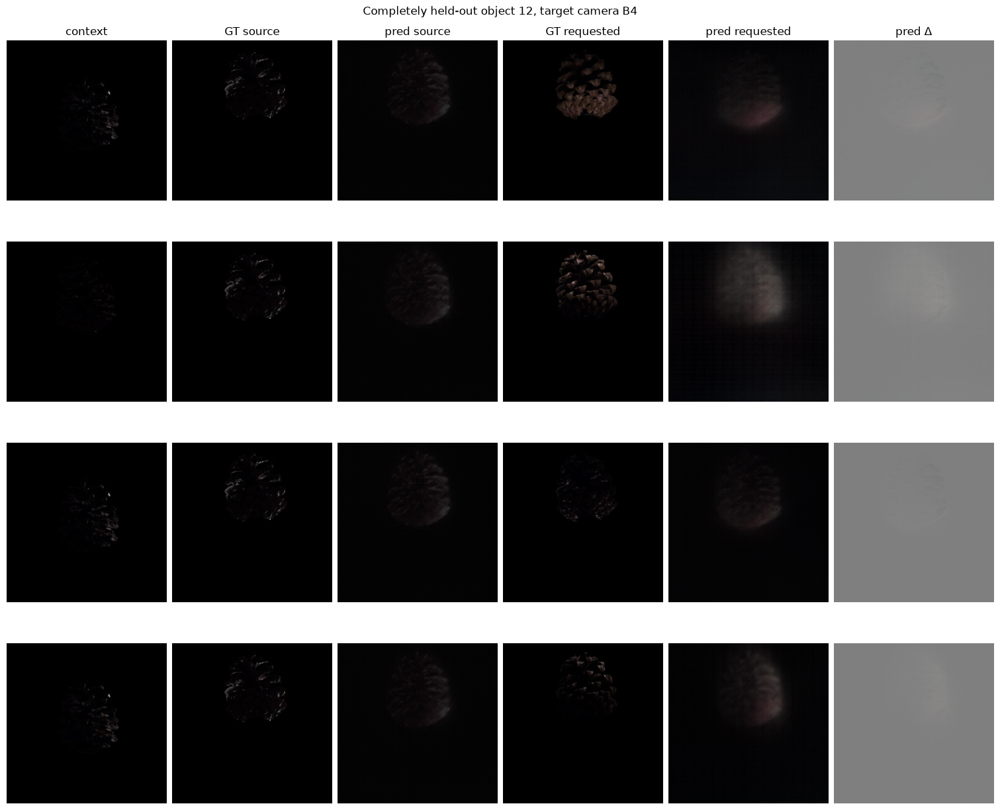

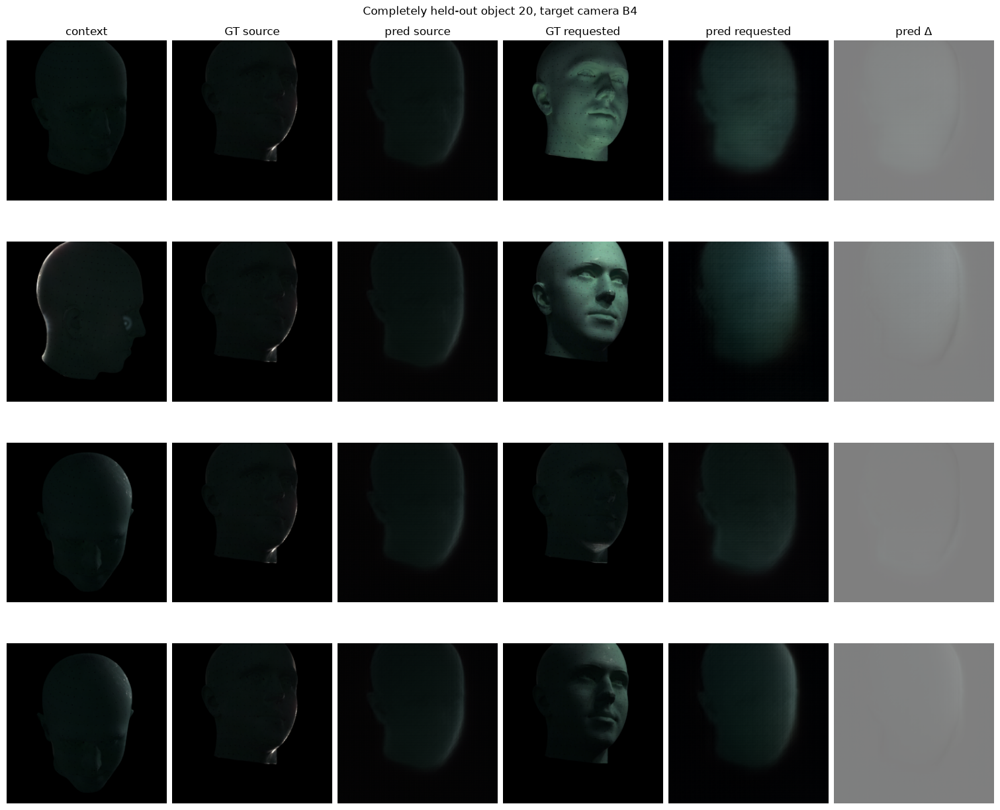

In [12]:
for object_id in evaluation_object_ids:
    batch = final_batches[object_id, 'B4'][0]
    pred_source, pred_requested = predictions(batch, test_args)
    source, gt_source, gt_requested = image01(batch.source), image01(batch.target_source), image01(batch.target_requested)
    rows = min(4, len(source)); titles = ['context', 'GT source', 'pred source', 'GT requested', 'pred requested', 'pred Δ']
    fig, axes = plt.subplots(rows, 6, figsize=(15, 3.1 * rows), constrained_layout=True)
    for row in range(rows):
        panels = [source[row, 0], gt_source[row], pred_source[row], gt_requested[row], pred_requested[row], delta_display(pred_requested[row], pred_source[row])]
        for column, panel in enumerate(panels):
            axes[row, column].imshow(np.clip(panel, 0, 1)); axes[row, column].axis('off')
            if row == 0: axes[row, column].set_title(titles[column])
    fig.suptitle(f'Completely held-out object {object_id}, target camera B4')
    plt.show()

## Novel-view synthesis retention

This measures pose-assisted NVS under the fixed source illumination. **Pretrained / bypass** calls the fine-tuned checkpoint with `target_light=None`; because all original RayDer parameters stayed frozen, this is exactly the pretrained reconstruction path. **Fine-tuned / source-conditioned** activates the learned controller with $\ell_s$. Both branches use the same cameras jointly inferred from the three contexts plus `target_source`; the latter supplies the target pose but is excluded from the decoder context. Four source-order permutations are measured for every held camera column; the final-object batches add every held-out object from the saved run. MSE and PSNR are measured on foreground pixels in [0, 1] RGB so that the black background does not dominate the comparison.

In [13]:
torch.cuda.empty_cache()

retention_mask = model._inference_block_mask(
    3, 1, (args.size // model.total_spatial_downsample) ** 2, DEVICE
)

@torch.inference_mode()
def nvs_retention_predictions(batch, eval_args=args):
    source = batch.source.to(DEVICE, non_blocking=True)
    cameras, world_rotation = camera_conditioning_for_batch(model, batch, source, eval_args, DEVICE)
    target_camera = cameras[:, -1:]
    source_light = batch.source_light.to(DEVICE, non_blocking=True)[:, None]
    if world_rotation is not None:
        source_light = source_light.clone()
        source_light[..., :3] = torch.einsum(
            'bij,bnj->bni', world_rotation.to(source_light), source_light[..., :3]
        )
    common = dict(
        x_in=source,
        camera_in=cameras[:, :3],
        camera_target=target_camera,
        state_target=source.new_zeros(len(source), 1, model.d_dynamic_state),
        block_mask=retention_mask,
        drop_state=True,
        temporal_positions=torch.tensor([0, 1, 2, 3], device=DEVICE),
    )
    with torch.autocast(device_type=DEVICE.type, dtype=torch.bfloat16, enabled=DEVICE.type == 'cuda'):
        pretrained = model._reconstruct(**common, target_light=None)[:, 0]
        conditioned = model._reconstruct(**common, target_light=source_light)[:, 0]
    return pretrained.float().cpu(), conditioned.float().cpu()

retention_records = []
validation_offset = len(train_lobes)
for object_id in args.train_objects:
    batches = evaluation_batches(
        args, object_id, heldout_cameras[object_id], [validation_offset] * 4, all_lobes
    )
    for batch in batches:
        pretrained_prediction, conditioned_prediction = nvs_retention_predictions(batch)
        retention_records.append((object_id, heldout_cameras[object_id], batch, pretrained_prediction, conditioned_prediction))
for (object_id, target_camera), batches in final_batches.items():
    for batch in batches:
        pretrained_prediction, conditioned_prediction = nvs_retention_predictions(batch, test_args)
        retention_records.append((object_id, target_camera, batch, pretrained_prediction, conditioned_prediction))
print(f'Evaluated {sum(len(batch.source) for _, _, batch, _, _ in retention_records)} NVS examples.')

Evaluated 76 NVS examples.


In [14]:
def per_example_foreground_mse(prediction, target, mask):
    squared_error = (prediction - target).square() * mask
    return squared_error.sum((1, 2, 3)) / (mask.sum((1, 2, 3)) * prediction.shape[-1]).clamp_min(1) / 4

retention_rows = []
for object_id, target_camera, batch, pretrained_prediction, conditioned_prediction in retention_records:
    pretrained_mse = per_example_foreground_mse(pretrained_prediction, batch.target_source, batch.mask)
    conditioned_mse = per_example_foreground_mse(conditioned_prediction, batch.target_source, batch.mask)
    for index in range(len(batch.source)):
        retention_rows.append({
            'object': object_id,
            'camera': target_camera,
            'pretrained_fg_mse': float(pretrained_mse[index]),
            'conditioned_fg_mse': float(conditioned_mse[index]),
        })
retention_details = pd.DataFrame(retention_rows)
retention_summary = retention_details.groupby(['object', 'camera']).agg(
    examples=('pretrained_fg_mse', 'size'),
    pretrained_fg_mse=('pretrained_fg_mse', 'mean'),
    conditioned_fg_mse=('conditioned_fg_mse', 'mean'),
).reset_index()
overall = pd.DataFrame([{
    'object': 'all', 'camera': 'all', 'examples': len(retention_details),
    'pretrained_fg_mse': retention_details.pretrained_fg_mse.mean(),
    'conditioned_fg_mse': retention_details.conditioned_fg_mse.mean(),
}])
retention_summary = pd.concat([retention_summary, overall], ignore_index=True)
retention_summary['pretrained_fg_psnr'] = -10 * np.log10(retention_summary.pretrained_fg_mse.clip(lower=1e-12))
retention_summary['conditioned_fg_psnr'] = -10 * np.log10(retention_summary.conditioned_fg_mse.clip(lower=1e-12))
retention_summary['fg_mse_change_%'] = 100 * (retention_summary.conditioned_fg_mse / retention_summary.pretrained_fg_mse - 1)
display(retention_summary.round(4))

,object,camera,examples,pretrained_fg_mse,conditioned_fg_mse,pretrained_fg_psnr,conditioned_fg_psnr,fg_mse_change_%
0,1,A1,4,0.0030,0.0044,25.2660,23.5166,49.6036
1,2,A2,4,0.0050,0.0051,22.9953,22.9032,2.1433
2,3,A3,4,0.0149,0.0148,18.2779,18.3103,-0.7427
3,4,A4,4,0.0020,0.0018,26.9278,27.4560,-11.4507
4,5,A5,4,0.0048,0.0034,23.1720,24.7018,-29.6901
5,6,A6,4,0.0084,0.0085,20.7330,20.6837,1.1421
6,8,B2,4,0.0108,0.0095,19.6734,20.2305,-12.0400
7,12,A4,8,0.0027,0.0026,25.6847,25.8945,-4.7159
8,12,B4,8,0.0023,0.0029,26.3187,25.4273,22.7826
9,12,C4,8,0.0017,0.0026,27.7308,25.7743,56.9091


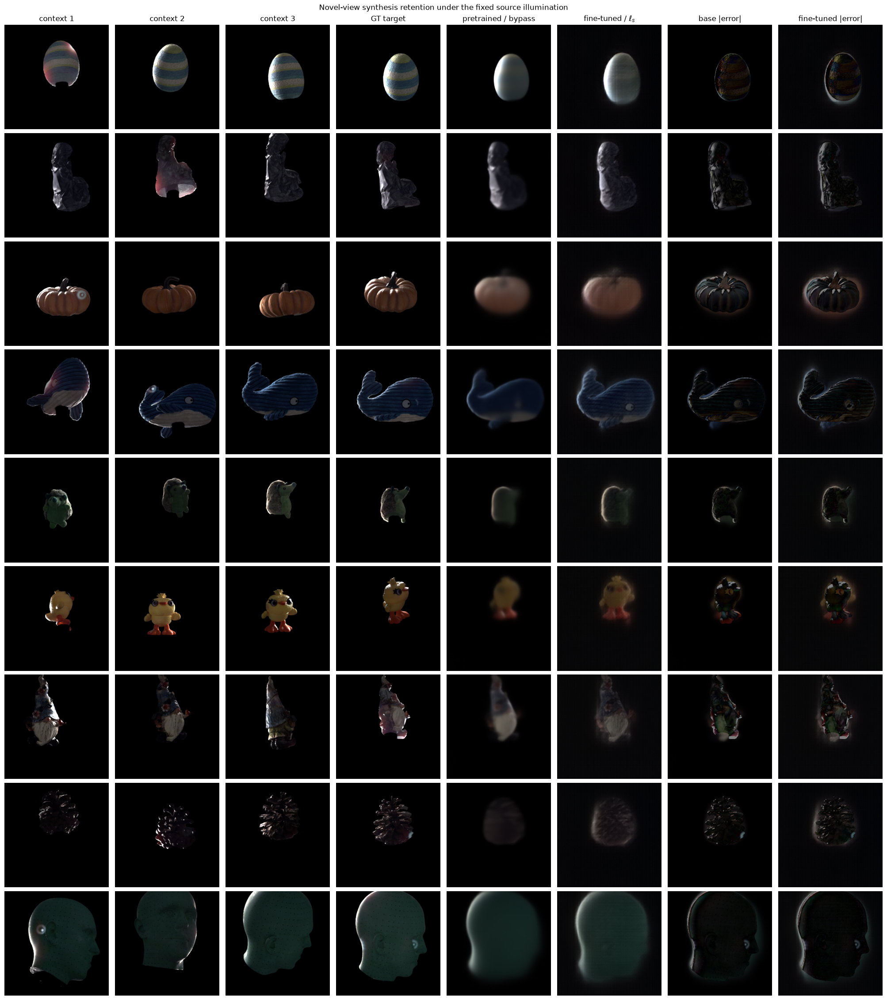

In [15]:
qualitative_objects = tuple(dict.fromkeys((*args.train_objects, *evaluation_object_ids)))
qualitative_records = {
    object_id: next(
            record for record in retention_records
            if record[0] == object_id
        )
    for object_id in qualitative_objects
}
titles = ['context 1', 'context 2', 'context 3', 'GT target', 'pretrained / bypass', r'fine-tuned / $\ell_s$', 'base |error|', 'fine-tuned |error|']
fig, axes = plt.subplots(len(qualitative_objects), len(titles), figsize=(20, 2.5 * len(qualitative_objects)), constrained_layout=True)
axes = np.atleast_2d(axes)
for row, object_id in enumerate(qualitative_objects):
    _, target_camera, batch, pretrained_prediction, conditioned_prediction = qualitative_records[object_id]
    sample = 0
    contexts = np.clip(image01(batch.source[sample]) * 2.0, 0.0, 1.0)
    target = np.clip(image01(batch.target_source[sample]) * 2.0, 0.0, 1.0)
    pretrained = np.clip(image01(pretrained_prediction[sample]) * 2.0, 0.0, 1.0)
    conditioned = np.clip(image01(conditioned_prediction[sample]) * 2.0, 0.0, 1.0)
    panels = [*contexts, target, pretrained, conditioned, np.abs(pretrained - target), np.abs(conditioned - target)]
    for column, panel in enumerate(panels):
        error_panel = column >= 6
        axes[row, column].imshow(np.clip(panel, 0, 0.5) if error_panel else np.clip(panel, 0, 1), cmap='magma' if error_panel else None, vmin=0 if error_panel else None, vmax=0.5 if error_panel else None)
        axes[row, column].axis('off')
        if row == 0: axes[row, column].set_title(titles[column])
    axes[row, 0].set_ylabel(f'object {object_id}\ntarget {target_camera}')
fig.suptitle('Novel-view synthesis retention under the fixed source illumination')
plt.show()

## RE-10k in-distribution light modulation

RE-10k is closer to in-distribution with respect to RayDer's pretraining, but these clips have neither controlled illumination nor a known alignment to the OpenIllumination world frame. We therefore use RayDer's normal pose inference on three context frames plus one observed target frame, exclude the target RGB from the decoder context, and compare the exact pretrained bypass (`target_light=None`) with a controlled sweep of the learned light input. The six directions are axes of **RayDer's inferred pose gauge**, not physical left/right/up/down labels. Bandwidth and energy are fixed to the medians of the training lobes, keeping every requested condition within the pilot's training distribution. This is a qualitative sensitivity test, not an accuracy evaluation.

In [ ]:
import imageio.v2 as imageio
from PIL import Image
from torchvision.transforms import InterpolationMode
from torchvision.transforms import functional as TF

RE10K_ROOT = ROOT / 'notebooks/data/RE-10k'
# A small, varied subset; replace names here to inspect other bundled clips.
RE10K_CLIPS = (
    'Cjpc9DpKgek_clip0049',  # bright indoor/outdoor boundary
    'Evr65DUJMl0_clip0040',  # warm interior
    'IBrbD_rTguQ_clip0061',  # dark
    'LlDpLUYqqXk_clip0023',  # outdoor daylight
)
RE10K_FRAME_INDICES = (0, 6, 12, 18)  # three contexts, then the target view

def load_re10k_frames(clip_name, frame_indices=RE10K_FRAME_INDICES, size=args.size):
    video_path = RE10K_ROOT / 'videos' / f'{clip_name}.mp4'
    if not video_path.is_file():
        raise FileNotFoundError(video_path)
    reader = imageio.get_reader(video_path)
    try:
        images = [Image.fromarray(reader.get_data(index)).convert('RGB') for index in frame_indices]
    finally:
        reader.close()
    frames = []
    for image in images:
        tensor = TF.pil_to_tensor(image)
        side = min(tensor.shape[-2:])
        tensor = TF.center_crop(tensor, [side, side])
        tensor = TF.resize(tensor, [size, size], interpolation=InterpolationMode.BILINEAR, antialias=True)
        frames.append(tensor.permute(1, 2, 0).float().div(127.5).sub(1.0))
    return torch.stack(frames)

re10k_frames = {clip_name: load_re10k_frames(clip_name) for clip_name in RE10K_CLIPS}
print({name: tuple(frames.shape) for name, frames in re10k_frames.items()})

{'Cjpc9DpKgek_clip0049': (4, 256, 256, 3), 'Evr65DUJMl0_clip0040': (4, 256, 256, 3), 'IBrbD_rTguQ_clip0061': (4, 256, 256, 3), 'LlDpLUYqqXk_clip0023': (4, 256, 256, 3)}


In [ ]:
axis_directions = np.asarray([
    [1, 0, 0], [-1, 0, 0],
    [0, 1, 0], [0, -1, 0],
    [0, 0, 1], [0, 0, -1],
], dtype=np.float32)
re10k_light_labels = ('+x', '-x', '+y', '-y', '+z', '-z')
train_conditions = np.stack([lobe.condition for lobe in train_lobes])
median_log_sigma, median_log_energy = np.max(train_conditions[:, 3:], axis=0)
re10k_light_conditions = np.concatenate([
    axis_directions + np.random.normal(6, 3) * 0.05,
    np.tile([median_log_sigma, median_log_energy], (len(axis_directions), 1)),
], axis=1).astype(np.float32)
print({'sigma': float(np.exp(median_log_sigma)), 'energy': float(np.exp(median_log_energy))})

@torch.inference_mode()
def re10k_light_predictions(frames, conditions=re10k_light_conditions):
    x = frames[None].to(DEVICE, non_blocking=True)
    temporal_ranks = torch.arange(x.shape[1], device=DEVICE)
    count = len(conditions)
    with torch.autocast(device_type=DEVICE.type, dtype=torch.bfloat16, enabled=DEVICE.type == 'cuda'):
        cameras, _ = model._estimate_cameras(x, temporal_ranks=temporal_ranks)
        target_camera = Camera(
            R=cameras.R[:, -1:].expand(-1, count, -1, -1),
            t=cameras.t[:, -1:].expand(-1, count, -1),
            f=cameras.f[:, -1:].expand(-1, count),
        )
        n_tokens = (args.size // model.total_spatial_downsample) ** 2
        bypass = model._reconstruct(
            x_in=x[:, :3], camera_in=cameras[:, :3], camera_target=cameras[:, -1:],
            state_target=x.new_zeros(1, 1, model.d_dynamic_state),
            block_mask=model._inference_block_mask(3, 1, n_tokens, DEVICE),
            drop_state=True, target_light=None, temporal_positions=temporal_ranks,
        )
        conditioned = model._reconstruct(
            x_in=x[:, :3], camera_in=cameras[:, :3], camera_target=target_camera,
            state_target=x.new_zeros(1, count, model.d_dynamic_state),
            block_mask=model._inference_block_mask(3, count, n_tokens, DEVICE),
            drop_state=True,
            target_light=torch.from_numpy(conditions).to(DEVICE)[None],
            temporal_positions=torch.tensor([0, 1, 2, *([3] * count)], device=DEVICE),
        )
    return bypass[0, 0].float().cpu(), conditioned[0].float().cpu()

torch.cuda.empty_cache()
re10k_results = {}
for clip_name, frames in re10k_frames.items():
    bypass, conditioned = re10k_light_predictions(frames)
    re10k_results[clip_name] = {
        'frames': image01(frames),
        'bypass': image01(bypass),
        'conditioned': image01(conditioned),
    }
print(f'Rendered {len(re10k_results)} clips under {len(re10k_light_labels)} light conditions.')

{'sigma': 0.3524518311023712, 'energy': 7.985873699188232}
Rendered 4 clips under 6 light conditions.


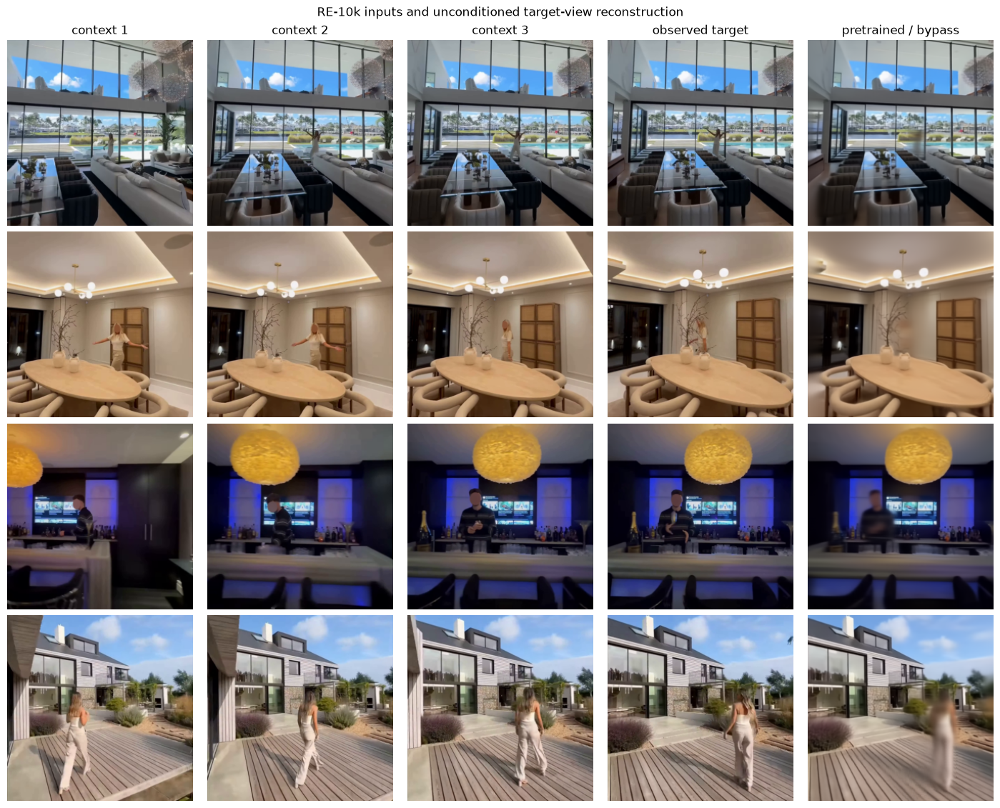

In [40]:
titles = [f'context {index + 1}' for index in range(3)] + ['observed target', 'pretrained / bypass']
fig, axes = plt.subplots(len(RE10K_CLIPS), len(titles), figsize=(14, 2.8 * len(RE10K_CLIPS)), constrained_layout=True)
axes = np.atleast_2d(axes)
for row, clip_name in enumerate(RE10K_CLIPS):
    result = re10k_results[clip_name]
    panels = [*result['frames'][:3], result['frames'][3], result['bypass']]
    for column, panel in enumerate(panels):
        axes[row, column].imshow(np.clip(panel, 0, 1))
        axes[row, column].axis('off')
        if row == 0:
            axes[row, column].set_title(titles[column])
    axes[row, 0].set_ylabel(clip_name, fontsize=8)
fig.suptitle('RE-10k inputs and unconditioned target-view reconstruction')
plt.show()

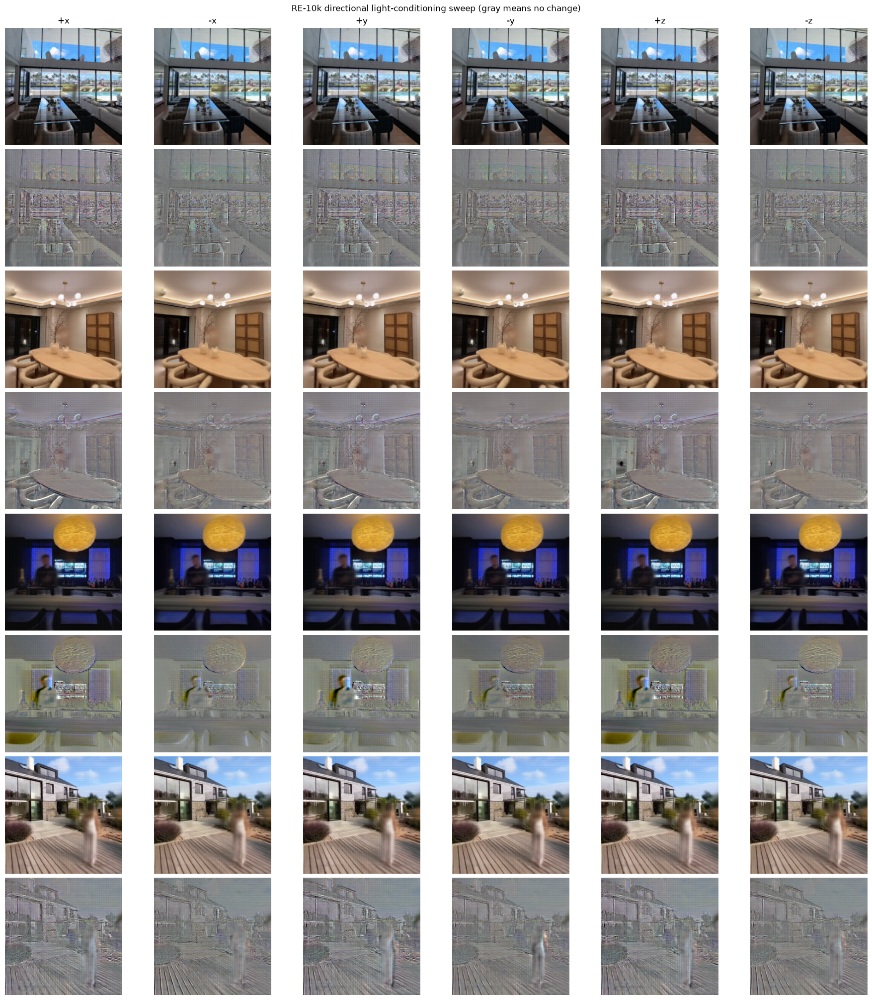

direction,+x,+y,+z,-x,-y,-z
clip,,,,,,
Cjpc9DpKgek_clip0049,0.0326,0.0301,0.0326,0.0249,0.0254,0.0239
Evr65DUJMl0_clip0040,0.0248,0.0239,0.0242,0.0173,0.0175,0.0170
IBrbD_rTguQ_clip0061,0.0374,0.0270,0.0398,0.0214,0.0336,0.0194
LlDpLUYqqXk_clip0023,0.0298,0.0298,0.0294,0.0235,0.0233,0.0225


In [41]:
delta_gain = 2.0
fig, axes = plt.subplots(2 * len(RE10K_CLIPS), len(re10k_light_labels), figsize=(18, 5 * len(RE10K_CLIPS)), constrained_layout=True)
axes = np.atleast_2d(axes)
for clip_index, clip_name in enumerate(RE10K_CLIPS):
    result = re10k_results[clip_name]
    for column, label in enumerate(re10k_light_labels):
        output = result['conditioned'][column]
        signed_delta = np.clip(0.5 + delta_gain * (output - result['bypass']), 0, 1)
        axes[2 * clip_index, column].imshow(np.clip(output, 0, 1))
        axes[2 * clip_index + 1, column].imshow(signed_delta)
        axes[2 * clip_index, column].axis('off')
        axes[2 * clip_index + 1, column].axis('off')
        if clip_index == 0:
            axes[0, column].set_title(label)
    axes[2 * clip_index, 0].set_ylabel(f'{clip_name}\nconditioned', fontsize=8)
    axes[2 * clip_index + 1, 0].set_ylabel(f'vs bypass\nsigned Δ × {delta_gain:g}', fontsize=8)
fig.suptitle('RE-10k directional light-conditioning sweep (gray means no change)')
plt.show()

modulation_strength = pd.DataFrame([
    {'clip': clip_name, 'direction': label,
     'mean_abs_delta': float(np.abs(result['conditioned'][index] - result['bypass']).mean())}
    for clip_name, result in re10k_results.items()
    for index, label in enumerate(re10k_light_labels)
]).pivot(index='clip', columns='direction', values='mean_abs_delta')
display(modulation_strength.round(4))